In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from articulate import articulate
from omegaconf import OmegaConf
from dotenv import load_dotenv
from articulate_anything.utils.viz import (
    show_video, 
    display_code, 
    show_videos, 
    display_codes,
    show_images,
)
from articulate_anything.utils.utils import load_config, join_path
from articulate_anything.utils.cotracker_utils import make_cotracker
from PIL import Image
import json

/home/vlongle/miniconda3/envs/articulate-anything-release/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
pybullet build time: Nov 28 2023 23:52:03


In [3]:
import os
os.chdir("..")

In [4]:
API_KEY = "YOUR-ACTUAL-API-KEY"
## we have our API key stored in a .env file
## Comment the `load_dotenv` and `os.environ.get` lines if you just want to use
## your API key directly
load_dotenv()
API_KEY = os.environ.get('API_KEY')

task = "suitcase"

Let's first take a look at the ground-truth video

In [5]:
video_path = f"datasets/in-the-wild-dataset/videos/{task}.mp4"

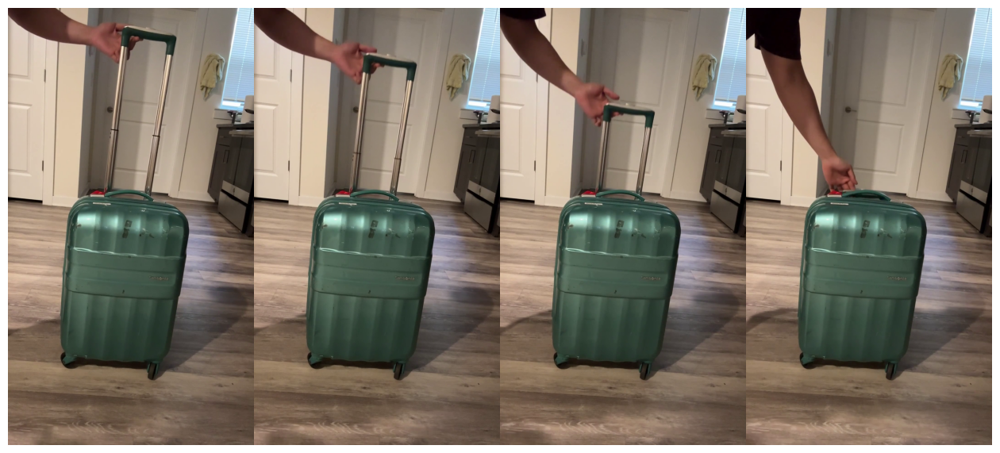

In [6]:
show_video(video_path)

We can annotate the motion in the video using Cotracker

In [7]:
cfg = load_config()

/home/vlongle/miniconda3/envs/articulate-anything-release/lib/python3.9/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'config': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


In [8]:
overwrite=False
aug_video = f"./datasets/in-the-wild-dataset/videos/aug_{task}.mp4"

# cfg.cotracker.max_moving_points = 10
cfg.cotracker.max_moving_points = 20
cfg.cotracker.grid_size = 30
if not os.path.exists(aug_video) or overwrite:
    cfg.cotracker.checkpoint_path = "../co-tracker/checkpoints/cotracker2.pth" ## PUT YOUR CHECKPOINT PATH HERE
    cfg.cotracker.mode = "online"
    cotracker_model = make_cotracker(cfg)
    cotracker_model.forward(video_path, **cfg.cotracker);

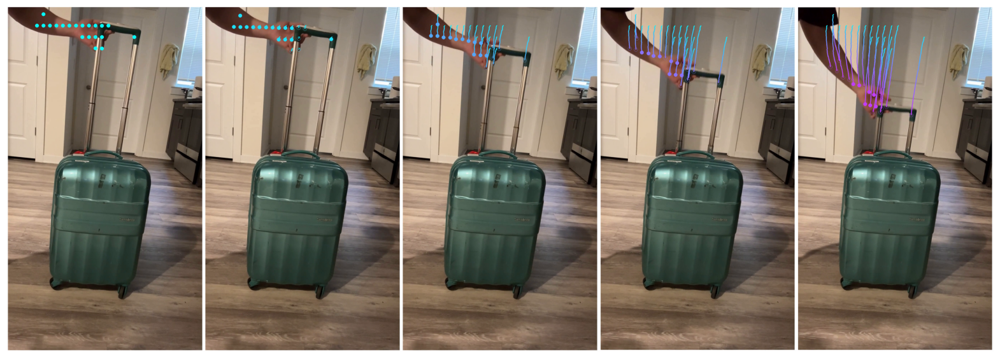

In [9]:
show_video(aug_video)

Before starting articulation, please make sure that the dataset is preprocessed by running

   ```bash
   python articulate_anything/preprocess/preprocess_partnet.py parallel={int} modality={image}
   ```
This renders a front-view image for each object in the PartNet-Mobility dataset. This is necessary for our mesh retrieval as we will compare the visual similarity between the input image or video against each rendered template object.

In [10]:
modality = "video"
prompt = video_path

Note: currently Gemini does not support multi-modal prompt finetuning. We have to use few-shot prompting instead. It's important to pick the examples with some care for your use case.

In [11]:
cfg = load_config()
cfg.prompt = prompt
cfg.modality = modality
cfg.out_dir = join_path("results", modality, task)



use_cotracker = True # {True, False}
mode = "video"
# mode = "image"
actor_prompting_type = "basic" # {basic, incontext}
critic_prompting_type = "incontext" # {basic, incontext}

cfg.joint_actor.mode = mode
cfg.joint_actor.use_cotracker = use_cotracker
cfg.joint_actor.type = actor_prompting_type
cfg.joint_actor.targetted_affordance = True
# cfg.joint_actor.targetted_affordance = False

cfg.joint_actor.examples_dir = "datasets/multi_modal_incontext_examples/joint_actor/in_context_actor_examples_datasets" ## Put your examples here


cfg.joint_critic.mode = mode
cfg.joint_critic.use_cotracker = use_cotracker
cfg.joint_critic.type = critic_prompting_type

cfg.joint_critic.examples_dir = "datasets/multi_modal_incontext_examples/joint_critic/in_context_examples_datasets" ## Put your examples here

cfg.actor_critic.actor_only = False

## important to set correctly for the joint_critic to works properly
## this should have the same direction as the ground-truth video
cfg.simulator.flip_video = False ## flip time for suitcase
cfg.simulator.ray_tracing=False
cfg.simulator.floor_texture = "plain"


# cfg.category_selector.topk = 3
cfg.category_selector.topk = 1 ## how many top categories should we search for an object template match
# this is because PartNet-Mobility dataset categories labels are sparse and sometimes not great


cfg.obj_selector.frame_index = 0

cfg.actor_critic.max_iter = 2
cfg.model_name = "gemini-1.5-flash-latest"


cfg.api_key = API_KEY ## loaded from .env file

In [13]:
steps = articulate(cfg);

INFO:root:Setting seed 0
INFO:root:Starting Mesh Retrieval
INFO:root:CategorySelector: Prediction already exists. Skipping generation.


candidate_obj_ids ['100248', '100249', '100550', '100767', '100776', '100825', '100836', '100837', '100838', '100839', '100840', '100842', '101048', '101049', '101050', '101051', '101668', '101673', '103755', '103757', '103761', '103762', '103770']
CFG.prompt datasets/in-the-wild-dataset/videos/suitcase.mp4


INFO:root:ObjectSelector: Prediction already exists at results/video/suitcase/obj_selector/round_0_0/object_selector_result.json. Skipping generation.
INFO:root:ObjectSelector: Prediction already exists at results/video/suitcase/obj_selector/round_0_10/object_selector_result.json. Skipping generation.
INFO:root:ObjectSelector: Prediction already exists at results/video/suitcase/obj_selector/round_0_20/object_selector_result.json. Skipping generation.
INFO:root:ObjectSelector: Prediction already exists at results/video/suitcase/obj_selector/round_1_0/object_selector_result.json. Skipping generation.
INFO:root:Starting Link Articulation
pybullet build time: Nov 28 2023 23:52:03
[2024-12-09 20:14:21.933] [svulkan2] [error] GLFW error: X11: The DISPLAY environment variable is missing
[2024-12-09 20:14:21.933] [svulkan2] [warning] Continue without GLFW.

INFO:root:Processing datasets/partnet-mobility-v0/dataset/101051/mobility.urdf
INFO:root:LinkPlacementActor: Generating content.
INFO:root

[2024-12-09 20:14:21,932][root][INFO] - >>>> Generating a stationary of joint: all | file: datasets/partnet-mobility-v0/dataset/101051/mobility.urdf



pybullet build time: Nov 28 2023 23:52:03
[2024-12-09 20:14:30.003] [svulkan2] [error] GLFW error: X11: The DISPLAY environment variable is missing
[2024-12-09 20:14:30.003] [svulkan2] [warning] Continue without GLFW.

INFO:root:GT link diff is {'position_diff': {'handle': 0.7931010099649431, 'wheel_2': 0.001000000000000209, 'wheel_4': 0.0010000000000000009, 'wheel_3': 0.001000000000000209, 'wheel': 0.0010000000000000009, 'suitcase_body': 0.0040000000000000036}, 'orientation_diff': {'handle': 0.0, 'wheel_2': 0.0, 'wheel_4': 0.0, 'wheel_3': 0.0, 'wheel': 0.0, 'suitcase_body': 0.0}}
INFO:root:LinkCritic: Generating content.
INFO:root:Prompt: ['The candidate function is:\n```python\nfrom articulate_anything.api.odio_urdf import *\n\n\ndef partnet_101051(input_dir, links):\n    """\n    No. masked_links: 7\n    Robot Link Summary:\n    - base\n    - handle\n    - wheel\n    - wheel_2\n    - wheel_3\n    - wheel_4\n    - suitcase_body\n\n    Object: a suitcase with wheels and a handle\n    

No. of link steps: 1
Picking the last link step
Link placement path: results/video/suitcase/link_placement/iter_0/seed_0/link_placement.py


pybullet build time: Nov 28 2023 23:52:03
[2024-12-09 20:14:39.578] [svulkan2] [error] GLFW error: X11: The DISPLAY environment variable is missing
[2024-12-09 20:14:39.578] [svulkan2] [warning] Continue without GLFW.

INFO:root:JointPredictionActor: Generating content.
INFO:root:Prompt: ['The groundtruth video is\n', <PIL.Image.Image image mode=RGB size=1104x1936 at 0x7F2D00E73AC0>, <PIL.Image.Image image mode=RGB size=1104x1936 at 0x7F2D00E73940>, <PIL.Image.Image image mode=RGB size=1104x1936 at 0x7F2D00E738B0>, <PIL.Image.Image image mode=RGB size=1106x1940 at 0x7F2D00E73820>, <PIL.Image.Image image mode=RGB size=1106x1939 at 0x7F2D00E73AF0>, 'The targetted affordance is\n`handle`', 'The link placement code is\n```python\nfrom articulate_anything.api.odio_urdf import *\n\n\ndef partnet_101051(input_dir, links):\n    """\n    No. masked_links: 7\n    Robot Link Summary:\n    - base\n    - handle\n    - wheel\n    - wheel_2\n    - wheel_3\n    - wheel_4\n    - suitcase_body\n\n    Ob

BEFORE FILTER VIDEO ['video_suitcase_body_to_handle_frontview.mp4']


/home/vlongle/miniconda3/envs/articulate-anything-release/lib/python3.9/site-packages/cotracker/models/build_cotracker.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

Video saved to ./results/video/suitcase/joint_actor/iter_0/seed_0/aug_video_suitcase_body_to_handle_frontview.mp4


INFO:root:GT joint diff is {'joint_type': True, 'joint_origin': {'xyz': 0.5022077534504484, 'orientation': 0.0}, 'joint_axis': 0.0, 'joint_limit': {'direction_diff': 0.0, 'range_diff': 0.08631919202804561}}
INFO:root:JointCriticMultiModalExamples: Generating content.
INFO:root:Prompt: ['Here are some examples. Study each of these examples carefully:\n', '## Example 1:\n', 'The groundtruth video is:\n', <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB430>, <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB4C0>, <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB490>, <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB520>, <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB370>, 'The prediction video is:\n', <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB550>, <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB4F0>, <PIL.Image.Image image mode=RGB size=640x480 at 0x7F2CFFCEB5B0>, <PIL.Image.Image image mode=RGB size=640x480

## Mesh Retrieval

Let's inspect the steps starting with the mesh retrieval

In [14]:
mesh_retrieval = steps["Mesh Retrieval"]

In [15]:
mesh_retrieval["Category Selection"].load_prediction()

{'target_object': 'a teal rolling suitcase with a retractable handle',
 'most_similar_objects': ['Suitcase'],
 'similarity_scores': [0.6083984375]}

In [16]:
obj_selector = mesh_retrieval["Object Selection"]
obj_selector.load_prediction()

{'selected_image': 'Image 15',
 'obj_ids': ['100248', '101051', '103770'],
 'obj_id': '101051'}

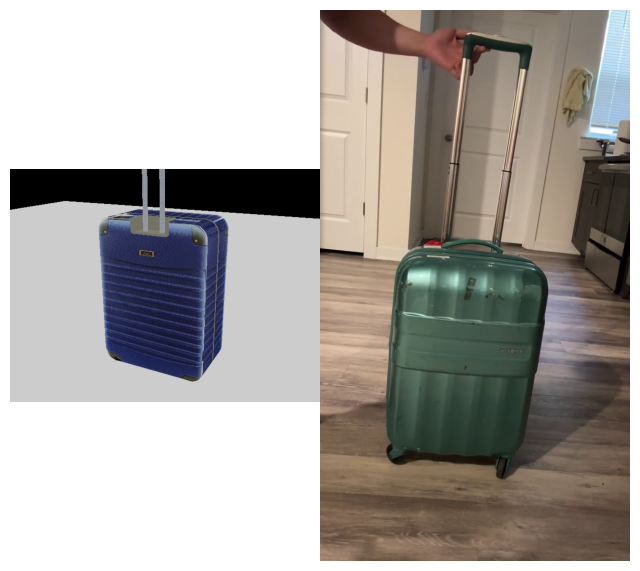

In [17]:
obj_selector.load_predicted_rendering()

## Link Placement

In [18]:
link_art = steps["Link Articulation"]
link_actors = link_art["Link actor"]
link_critics = link_art["Link critic"]
assert len(link_actors) == len(link_critics)
print(f"Link placement runs for {len(link_actors)} iteration(s)")

Link placement runs for 1 iteration(s)


In [19]:
link_feedbacks = [json.dumps(link_critic.load_prediction(),
                             indent=4) for link_critic in link_critics]

link_codes = [link_actor.load_prediction() for link_actor in link_actors]

link_preds = [link_actor.load_predicted_rendering() for link_actor in link_actors]

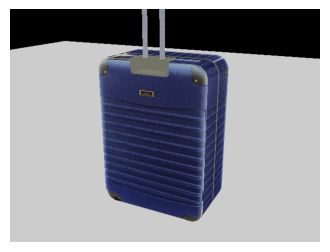

╷  
                                                                           │  
╶──────────────────────────────────────────────────────────────────────────┼─╴
 from articulate_anything.api.odio_urdf import *                           │  
                                                                           │  
                                                                           │  
 def partnet_101051(input_dir, links):                                     │  
     """                                                                   │  
     No. masked_links: 7                                                   │  
     Robot Link Summary:                                                   │  
     - base                                                                │  
     - handle                                                              │  
     - wheel                                                               │  
     - wheel_2                                                             │  
     - wheel_3                                                             │  
     - wheel_4                                                             │  
     - suitcase_body                                                       │  
                                                                           │  
     Object: a suitcase with wheels and a handle                           │  
     """                                                                   │  
     pred_robot = Robot(input_dir=input_dir, name="suitcase")              │  
     pred_robot.add_link(links['base'])                                    │  
     pred_robot.add_link(links['suitcase_body'])                           │  
     pred_robot.add_joint(Joint("base_to_suitcase_body",                   │  
                          Parent("base"),                                  │  
                          Child("suitcase_body"),                          │  
                          type="fixed"),                                   │  
                          )                                                │  
     pred_robot.add_link(links['handle'])                                  │  
     pred_robot.place_relative_to('handle', 'suitcase_body',               │  
                                  placement="above",                       │  
                                  clearance=0.0)                           │  
                                                                           │  
     for wheel_idx in range(4):                                            │  
         wheel_link = "wheel" if wheel_idx == 0 else f"wheel_{wheel_idx+1}"│  
         pred_robot.add_link(links[wheel_link])                            │  
         pred_robot.place_relative_to(wheel_link, 'suitcase_body',         │  
                                      placement="below",                   │  
                                      clearance=0.0)                       │  
                                                                           │  
     return pred_robot                                                     │  
                                                                           ╵

╷  
                                                                              │  
╶─────────────────────────────────────────────────────────────────────────────┼─╴
 {                                                                            │  
     "realism_rating": 10,                                                    │  
     "description": "The prediction is visually identical to the groundtruth."│  
 }                                                                            │  
                                                                              ╵

In [20]:
show_images(link_preds)
display_codes(link_codes)
display_codes(link_feedbacks)

Note: 
1. some object part names need relabeling because PartNet-Mobility part labeling is not great. For example, a lid's pump rod would be labeled as `lid` or a door knob would be labeled as `door`. **solution**: gemini annotation based on mesh images + maybe some manual relabeling. This is done automatically by the `preprocess_partnet.py`
2. Some meshes are also not "clean" so there would be floating points in the air that affect our collision detection algorithm  and thus our link placement but might not immediate visible to the eye. **solution**: use [open3d](https://www.open3d.org/docs/release/tutorial/geometry/mesh.html#Connected-components) to clean up the meshes.

## Targetted Affordance Extractor

Our system can automatically maps the affordance in the video to a part in the simulated 3D model. But there might be error that you need to manually correct.

In [21]:
extractor = steps["Affordance Extraction"]


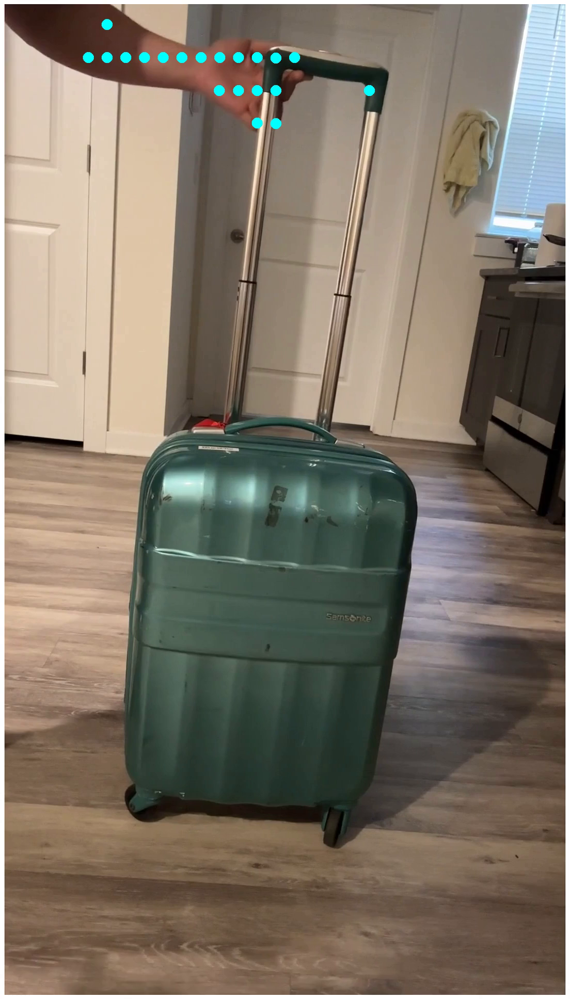
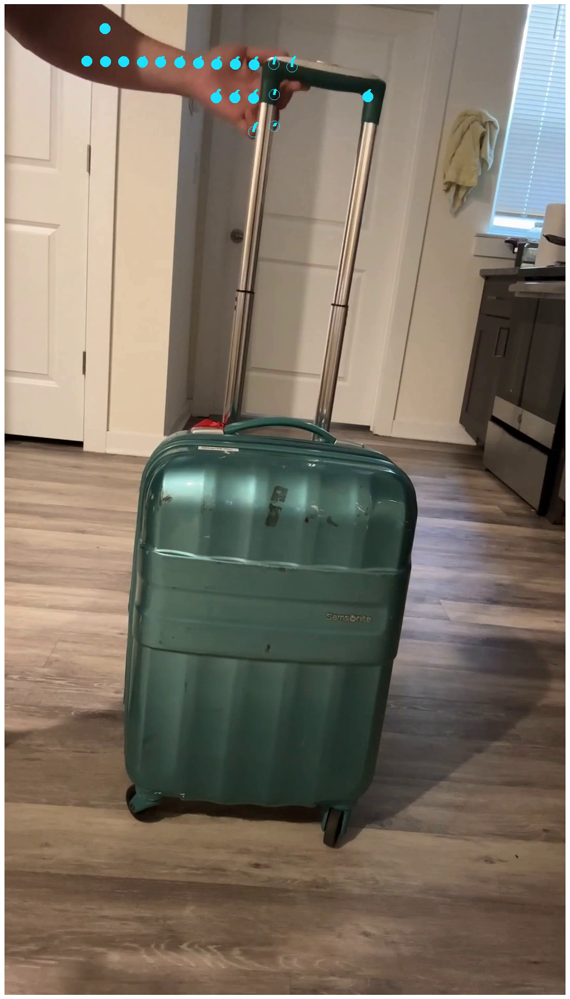
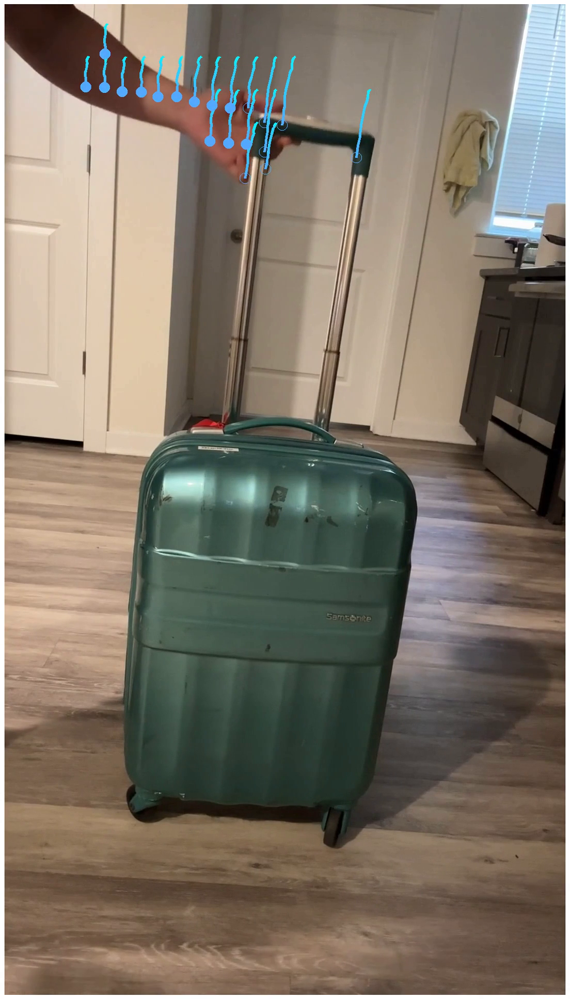
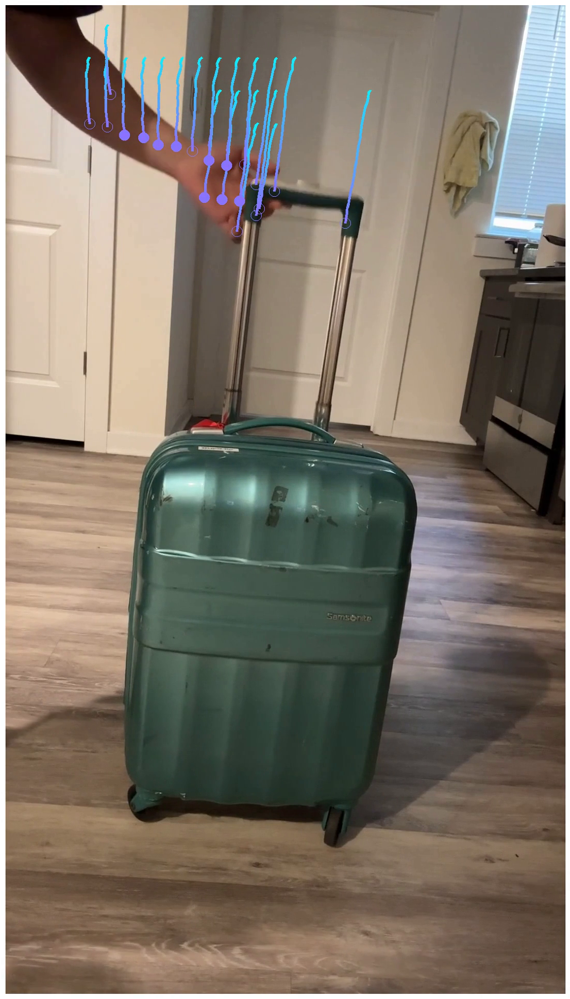
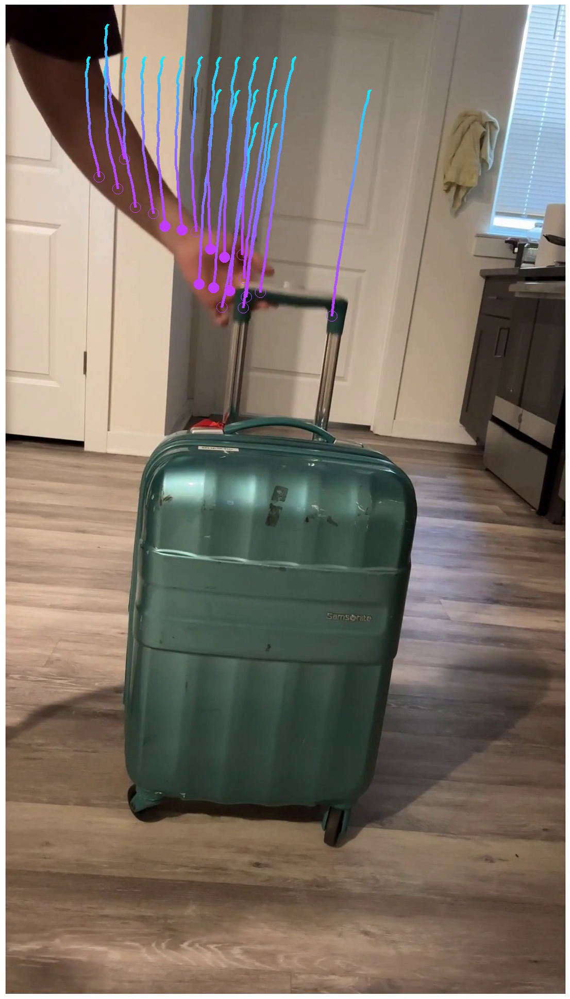
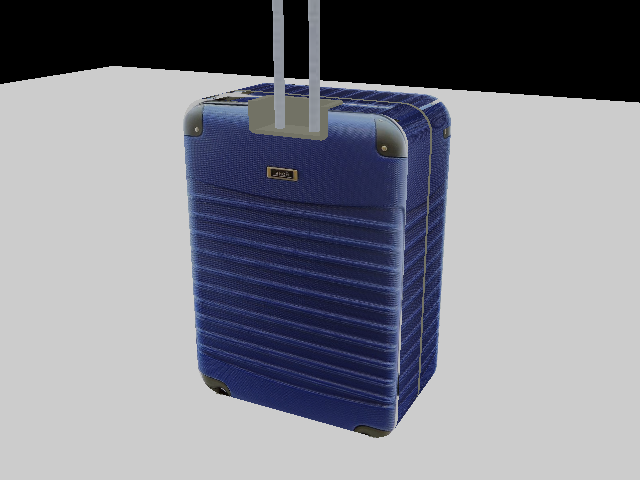
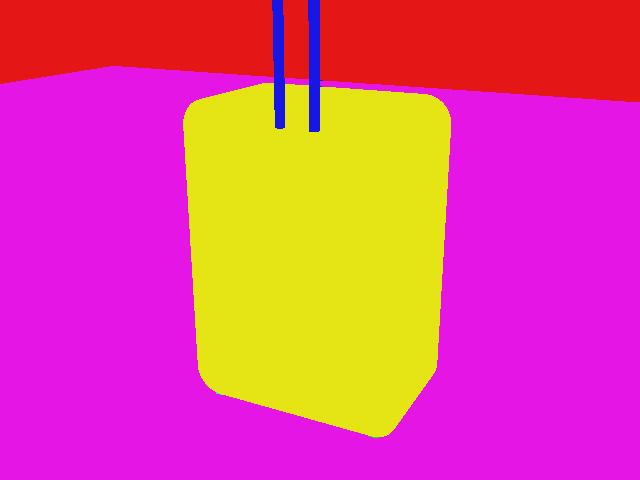

In [22]:
extractor.load_prompt_parts()

In [23]:
extractor.load_prediction()

{'img_description': [{'part_name': 'suitcase_body', 'part_color': 'yellow'},
  {'part_name': 'handle', 'part_color': 'blue'}],
 'gt_object': {'description': 'A teal suitcase with a retractable handle and wheels. The handle is being pulled up by a person.'},
 'affordance': {'description': 'A person is pulling up the handle of a suitcase. The handle is extending upwards.',
  'moving_part': 'handle'},
 'part_name': 'handle',
 'part_color': 'blue'}

## Joint Prediction

In [24]:
joint_art = steps["Joint Articulation"]
joint_actors = joint_art["Joint actor"]
joint_critics = joint_art["Joint critic"]


assert len(joint_actors) == len(joint_critics)
print(f"Joint prediction runs for {len(joint_actors)} iteration(s)")

Joint prediction runs for 1 iteration(s)


In [25]:
joint_codes = [joint_actor.load_prediction() for joint_actor in joint_actors]
joint_preds = [joint_actor.load_predicted_rendering() for joint_actor in joint_actors]
joint_feedbacks = [json.dumps(joint_critic.load_prediction(),
                             indent=4) for joint_critic in joint_critics]

BEFORE FILTER VIDEO ['video_suitcase_body_to_handle_frontview.mp4']


/home/vlongle/miniconda3/envs/articulate-anything-release/lib/python3.9/site-packages/cotracker/models/build_cotracker.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

Video saved to ./results/video/suitcase/joint_actor/iter_0/seed_0/aug_video_suitcase_body_to_handle_frontview.mp4


""

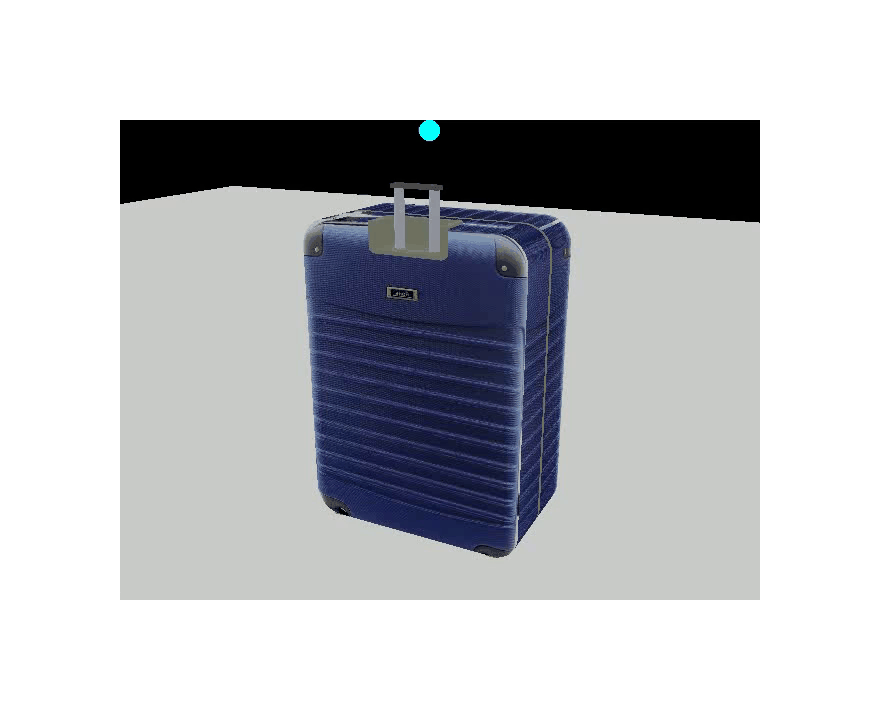

╷  
                                                                               │  
╶──────────────────────────────────────────────────────────────────────────────┼─╴
 from articulate_anything.api.odio_urdf import *                               │  
                                                                               │  
                                                                               │  
 def partnet_101051(input_dir, links):                                         │  
     """                                                                       │  
     No. masked_links: 7                                                       │  
     Robot Link Summary:                                                       │  
     - base                                                                    │  
     - handle                                                                  │  
     - wheel                                                                   │  
     - wheel_2                                                                 │  
     - wheel_3                                                                 │  
     - wheel_4                                                                 │  
     - suitcase_body                                                           │  
                                                                               │  
     Object: a suitcase with wheels and a handle                               │  
     Targetted affordance: "handle"                                            │  
     """                                                                       │  
     pred_robot = Robot(input_dir=input_dir, name="suitcase")                  │  
     pred_robot.add_link(links['base'])                                        │  
     pred_robot.add_link(links['suitcase_body'])                               │  
     pred_robot.add_joint(Joint("base_to_suitcase_body",                       │  
                          Parent("base"),                                      │  
                          Child("suitcase_body"),                              │  
                          type="fixed"),                                       │  
                          )                                                    │  
     pred_robot.add_link(links['handle'])                                      │  
     pred_robot.place_relative_to('handle', 'suitcase_body',                   │  
                                  placement="above",                           │  
                                  clearance=0.0)                               │  
                                                                               │  
     for wheel_idx in range(4):                                                │  
         wheel_link = "wheel" if wheel_idx == 0 else f"wheel_{wheel_idx+1}"    │  
         pred_robot.add_link(links[wheel_link])                                │  
         pred_robot.place_relative_to(wheel_link, 'suitcase_body',             │  
                                      placement="below",                       │  
                                      clearance=0.0)                           │  
                                                                               │  
     # ====================JOINT PREDICTION====================                │  
     upper_point = [0, 0, 0]  # handle is fully extended                       │  
     bb = pred_robot.get_bounding_boxes(["handle"], include_dim=True)["handle"]│  
     bb_dim = bb[1]                                                            │  
     factor = 0.8 # handle does not fully retract                              │  
     lower_point = [0, 0, -factor * bb_dim["height[38;2;230;219;116;48;2;39;4

╷ 
                                                                                                                │ 
╶───────────────────────────────────────────────────────────────────────────────────────────────────────────────┼╴
 {                                                                                                              │ 
     "gt_description": "The ground truth video shows a person pulling up a suitcase handle. The handle slides u…│ 
     "pred_description": "The prediction video shows the handle moving up and down along the z-axis.",          │ 
     "candidate_function_description": "The candidate function uses `make_prismatic_joint` with the correct axi…│ 
     "failure_reason": "success",                                                                               │ 
     "improvement_suggestion": "None",                                                                          │ 
     "realism_rating": 10                                                                                       │ 
 }                                                                                                              │ 
                                                                                                                ╵

In [26]:
show_videos(joint_preds, width=512, height=512)
display_codes(joint_codes)
display_codes(joint_feedbacks)